# Ripserer.jl [link](https://github.com/mtsch/Ripserer.jl)

In [1]:
using Pkg

In [2]:
using LinearAlgebra
using Plots
using Ripserer

In [3]:
using NPZ

In [4]:
using DelimitedFiles

In [5]:
function annulus(n, r1=1, r2=2, offset=(3, 2))
    result = Tuple{Float64,Float64}[]
    while length(result) < n
        point = 2 * r2 * rand(2) .- r2
        if r1 < norm(point) < r2
            push!(result, (point[1], point[2]))
        end
    end
    while length(result) < 2 * n
        point = 2 * r2 * rand(2) .- r2
        if r1 < norm(point) < r2
            push!(result, (point[1] + offset[1], point[2] + offset[2]))
        end
    end
    while length(result) < 3 * n
        point = 2 * r2 * rand(2) .- r2
        if r1 < norm(point) < r2
            push!(result, (point[1] - offset[1], point[2] + offset[2]))
        end
    end
    return result
end


annulus (generic function with 4 methods)

In [9]:
function torus(n)
    Θ = ϕ = range(-π,π,n)
    X = [(2 + cos(v)) * cos(u) for u in Θ, v in ϕ]
    Y = [(2 + cos(v)) * sin(u) for u in Θ, v in ϕ]
    Z = [1.5 * sin(v) for u in Θ, v in ϕ]
    result = Tuple{Float64,Float64, Float64}[]
    for x in X
        for y in Y 
            for z in Z 
                push!(result, (x, y, z))
            end
        end
    end
    return result    
end

torus (generic function with 1 method)

In [10]:
tor = unique!(torus(4))

128-element Vector{Tuple{Float64, Float64, Float64}}:
 (-1.0, -1.2246467991473532e-16, -1.8369701987210297e-16)
 (-1.0, -1.2246467991473532e-16, -1.299038105676658)
 (-1.0, -1.2246467991473532e-16, 1.299038105676658)
 (-1.0, -1.2246467991473532e-16, 1.8369701987210297e-16)
 (-1.0, -0.8660254037844386, -1.8369701987210297e-16)
 (-1.0, -0.8660254037844386, -1.299038105676658)
 (-1.0, -0.8660254037844386, 1.299038105676658)
 (-1.0, -0.8660254037844386, 1.8369701987210297e-16)
 (-1.0, 0.8660254037844386, -1.8369701987210297e-16)
 (-1.0, 0.8660254037844386, -1.299038105676658)
 (-1.0, 0.8660254037844386, 1.299038105676658)
 (-1.0, 0.8660254037844386, 1.8369701987210297e-16)
 (-1.0, 1.2246467991473532e-16, -1.8369701987210297e-16)
 ⋮
 (1.2500000000000002, -2.1650635094610964, -1.8369701987210297e-16)
 (1.2500000000000002, -2.1650635094610964, -1.299038105676658)
 (1.2500000000000002, -2.1650635094610964, 1.299038105676658)
 (1.2500000000000002, -2.1650635094610964, 1.8369701987210297e-16)
 (

In [11]:
torus_diagram = ripserer(tor; alg = :involuted, modulus = 2, dim_max=3)

4-element Vector{PersistenceDiagrams.PersistenceDiagram}:
 128-element 0-dimensional PersistenceDiagram
 86-element 1-dimensional PersistenceDiagram
 0-element 2-dimensional PersistenceDiagram
 24-element 3-dimensional PersistenceDiagram

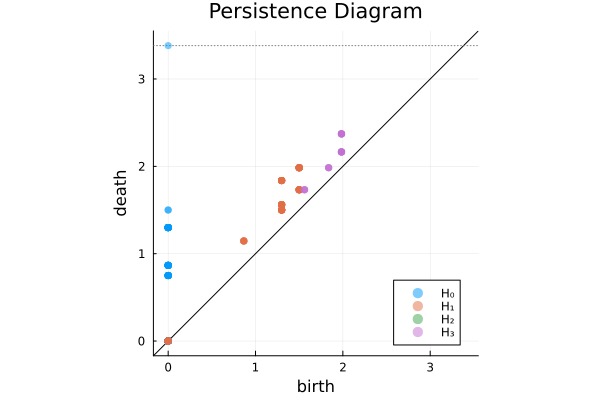

In [12]:
plot(torus_diagram)

In [14]:
annulus_data = annulus(200)

600-element Vector{Tuple{Float64, Float64}}:
 (1.9138191986043376, 0.15181801408766704)
 (0.32493264473225736, 1.3671957952882048)
 (-0.0073015785008259115, -1.3250213584699941)
 (1.4183651074097914, 1.258291012962094)
 (1.7326913090196108, 0.3978483819306389)
 (0.3372345868622739, 1.5769749291581232)
 (0.1898396387503416, 1.56167885574569)
 (0.9072461265818972, 1.5731040724604806)
 (-1.1029294790791715, 0.35478176205878675)
 (-1.6229271516974522, 0.18160794096376387)
 (0.30278310222701776, -1.670389439414616)
 (0.10225453827459852, 1.1946671136494964)
 (-0.08567081997301385, 1.0001412210637546)
 ⋮
 (-4.855972417853602, 2.2853480667736847)
 (-3.8205064369885613, 0.6295793885053946)
 (-2.053369535573251, 0.26726846364641466)
 (-4.330725028137884, 3.4500151438054885)
 (-4.3550359803471235, 3.208982352393027)
 (-4.415435950634496, 1.344409794974041)
 (-2.105370838735086, 1.173917486835005)
 (-2.919128314370351, 3.1729741482113694)
 (-1.9521747231461544, 2.826183772731962)
 (-2.96331104632

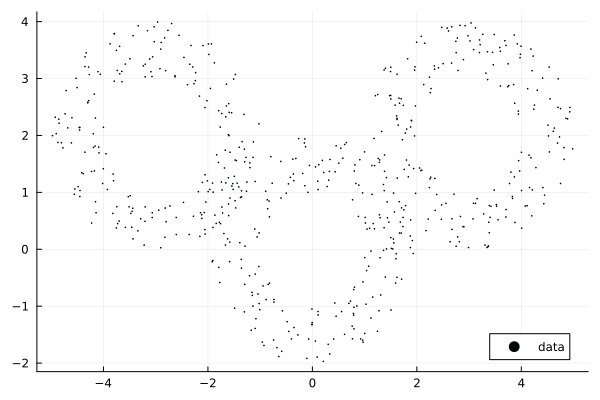

In [15]:
scatter(annulus_data; label = "data", markersize = 0.5)

In [16]:
annulus_cycles = ripserer(annulus_data; alg = :involuted, modulus = 2)

2-element Vector{PersistenceDiagrams.PersistenceDiagram}:
 600-element 0-dimensional PersistenceDiagram
 121-element 1-dimensional PersistenceDiagram

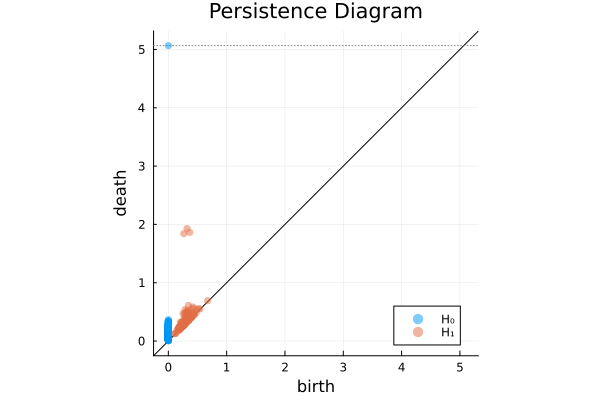

In [17]:
plot(annulus_cycles)

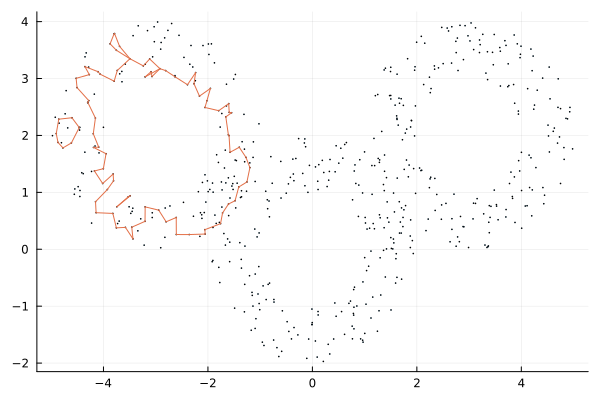

In [18]:
scatter(annulus_data; label = "data", markersize = 0.5)
chain = annulus_cycles[2][end].representative
v = vertices.(chain)
# println(length(v))
# for i in 1:length(v)
#     a = min(v[i][1], v[i][2])
#     b = max(v[i][1], v[i][2])
#     c = [annulus_data[a][1], annulus_data[b][1]]  
#     d = [annulus_data[a][2], annulus_data[b][2]] 
#     plot!(c, d,  linewidth = 1,legend = :false)
#     continue
#     
# end
 
plot!(annulus_cycles[2][end], annulus_data, legend = :false)    
plot!()


121


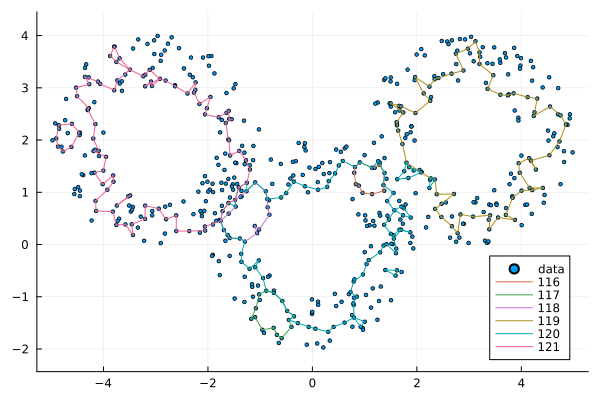

In [19]:
scatter(annulus_data; label = "data", markersize = 2, aspect_ratio = 1)
N = length(annulus_cycles[2])
println(N)
for i in (N - 5):N
    plot!(annulus_cycles[2][i], annulus_data; label = "$i")    
end 
plot!()   


In [20]:
function SaveVecToFile(vec::Vector{Int64}, fn::String)
  writedlm(fn, vec)
  println("saved $fn")
end

SaveVecToFile (generic function with 1 method)

In [ ]:
scatter(data; label = "data", markersize = 2, aspect_ratio = 1)
N = length(diagram_cycles[2])
println(N)
for i in (length(diagram_cycles[2]) - 5):length(diagram_cycles[2]) - 1
    plot!(diagram_cycles[2][i], data; label = "$i")    
end 
plot!(diagram_cycles[2][end], data; label = "$N")   


In [22]:
data_rus = npzread("D:\\GrishHelen\\ПМИ\\2 курс\\Spot-the-bot\\optimizations of lang\\rus_100to2tsne_sparse_25245points.npy")

25245×2 Matrix{Float32}:
 -104.888     -33.3701
  -85.4083    -51.4955
  -60.5044    -78.8386
  -23.0258   -113.193
 -105.234     -33.2034
 -103.831     -33.4036
  -44.7499    -95.4816
  -41.4716     -0.364276
 -101.82      -33.9088
 -109.415       6.00465
 -107.078     -43.9968
   -5.99604   -52.1283
    8.94913    -8.27123
    ⋮        
   16.4244    -38.849
   38.0001     -9.13832
 -127.824     -21.3391
   75.4984    100.355
   42.8131    -21.7484
   30.3135    -33.1873
  -87.3671     89.1275
  -32.2209    -31.6596
   70.5108    -25.6185
  -18.6944    142.574
  -38.9279    -50.3881
   57.6936    107.922

In [ ]:
data_rus = npzread("D:\\GrishHelen\\ПМИ\\2 курс\\Spot-the-bot\\SVD_embeddings\\rus_100to2_tsne.npy")

In [23]:
size(data_rus)[1]

25245

In [24]:
# all
data_r = [Tuple(x for x in data_rus[i, :]) for i in 1:size(data_rus)[1]]
data_r = unique!(data_r)

12637-element Vector{Tuple{Float32, Float32}}:
 (-104.8879, -33.370056)
 (-85.408325, -51.49549)
 (-60.504406, -78.838646)
 (-23.025784, -113.1928)
 (-105.234344, -33.20339)
 (-103.83071, -33.403645)
 (-44.74986, -95.48163)
 (-41.47161, -0.36427647)
 (-101.82048, -33.90884)
 (-109.415344, 6.0046463)
 (-107.07778, -43.99677)
 (-5.9960356, -52.128284)
 (8.949131, -8.271229)
 ⋮
 (55.705463, -10.3382845)
 (-61.732502, -82.66912)
 (-6.075306, -69.27457)
 (61.539536, 122.229935)
 (-26.17612, 41.052734)
 (-44.91316, 15.156442)
 (16.42435, -38.849037)
 (75.49842, 100.354546)
 (42.81306, -21.748375)
 (-87.36713, 89.127525)
 (-32.220863, -31.659643)
 (-18.694355, 142.5736)

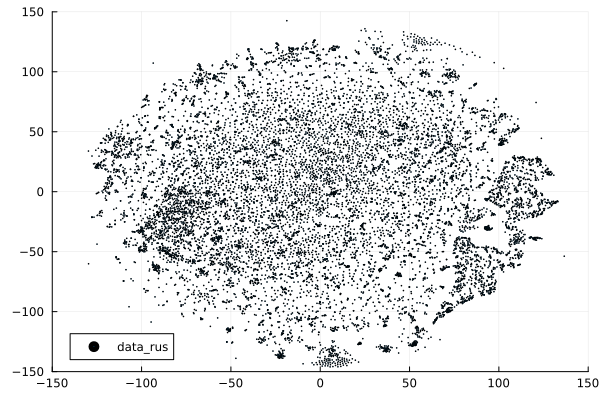

In [25]:
scatter(data_r; label = "data_rus", markersize = 0.5, ylimits = (-150,150), xlimits = (-150,150))

In [ ]:
# take eng part
data_r = Array{Tuple{Float32,Float32},1}()
for i in 1:size(data_rus)[1]
    if data_rus[i, 2] < 4 * data_rus[i, 1] - 350 && -115 < data_rus[i,2]<40
        data_r = push!(data_r, Tuple(Float32(x) for x in data_rus[i, :]))
        # println(Tuple(x for x in data_rus[i, :]))
    end
end
data_r = unique!(data_r)

In [ ]:
# center lower part
data_r = Array{Tuple{Float32,Float32},1}()
for i in 1:size(data_rus)[1]
    if -50 < data_rus[i, 1]  < 50 && data_rus[i,2] < 0
        data_r = push!(data_r, Tuple(Float32(x) for x in data_rus[i, :]))
        # println(Tuple(x for x in data_rus[i, :]))
    end
end
data_r = unique!(data_r)

In [ ]:
# smaller center lower part
data_r = Array{Tuple{Float32,Float32},1}()
for i in 1:size(data_rus)[1]
    if -45 < data_rus[i, 1] < 30 && data_rus[i, 2] < -50
        global data_r = push!(data_r, Tuple(Float32(x) for x in data_rus[i, :]))
        # println(Tuple(x for x in data_rus[i, :]))
    end
end
data_r = unique!(data_r)

In [ ]:
data_r = [Tuple(x for x in data_rus[i, :]) for i in 1:size(data_rus)[1]]

In [ ]:
data_r = unique!(data_r)

In [ ]:
scatter(data_r; label = "data_rus", markersize = 0.5, ylimits = (-150,150), xlimits = (-150,150))
savefig("plot.png")

In [26]:
diagram_rus = ripserer(data_r; alg = :involuted, modulus = 2)

2-element Vector{PersistenceDiagrams.PersistenceDiagram}:
 12637-element 0-dimensional PersistenceDiagram
 2871-element 1-dimensional PersistenceDiagram

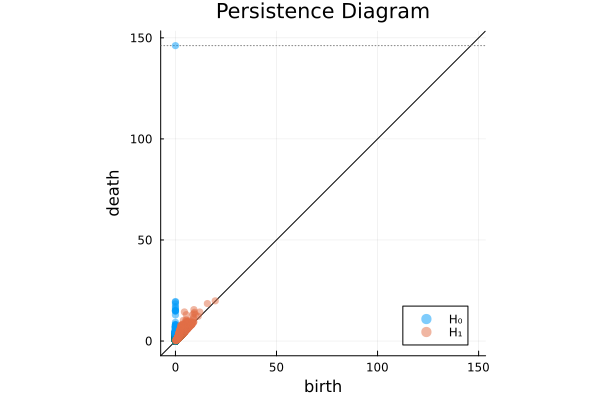

In [27]:
plot(diagram_rus)

In [28]:
diagram_rus[2][end]

[4.44, 14.4) with:
 birth_simplex: Simplex{1, Float32, Int64}
 death_simplex: Simplex{2, Float32, Int64}
 representative: 221-element Chain{Mod{2},Simplex{1, Float32, Int64}}

In [29]:
diagram_rus

2-element Vector{PersistenceDiagrams.PersistenceDiagram}:
 12637-element 0-dimensional PersistenceDiagram
 2871-element 1-dimensional PersistenceDiagram

2871


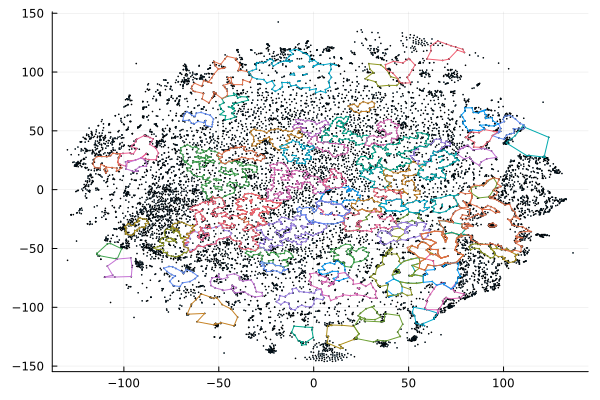

In [30]:
scatter(data_r; label = "data_rus", markersize = 0.5, legend=false)
N = length(diagram_rus[2])
println(N)
for n in N-80:N
    plot!(diagram_rus[2][n], data_r)
end
plot!()

In [ ]:
cnt_cycles = length(diagram_rus[2])

file = open("file.txt", "w")

for i in 1:cnt_cycles
    chain = diagram_rus[2][i].representative
    v = vertices.(chain)
    a = []
    k = length(v)
    for j in 1:k
        push!(a, v[j][1])
        push!(a, v[j][2])
    end
    a = unique!(a)
    for j in a
        write(file, "$(j)\n")
    end
    write(file, "\n\n")
    
end
println("here")

close(file)

In [ ]:
diagram_rus5 = ripserer(data_r5)
plot(diagram_rus5)

In [ ]:
diagram_cycles = ripserer(data_r; alg = :involuted, modulus = 2)

In [ ]:
data_rus_big = npzread("D:\\GrishHelen\\ПМИ\\2 курс\\Spot-the-bot\\optimizations of lang\\rus_100to2tsne_sparse_62636points.npy")

In [ ]:
data_r_big = [Tuple(x for x in data_rus_big[i, :]) for i in 1:size(data_rus_big)[1]]
data_r_big = unique!(data_r_big)

In [ ]:
scatter(data_r_big; label = "data_rus", markersize = 0.5, legend=false)

In [ ]:
diagram_rus_big = ripserer(data_r_big; alg = :involuted, modulus = 2)

In [ ]:
plot(diagram_rus_big)

In [ ]:
diagram_rus_big

In [ ]:
scatter(data_r_big; label = "data_rus_60k", markersize = 0.5, legend=false)
N_big = length(diagram_rus_big[2])
println(N_big)
for n in 1:10
    plot!(diagram_rus_big[2][n], data_r_big; label="$n")
end
plot!()